# ARREGLO DE LAS TABLAS
## ARREGLANDO LA TABLA DE CARACTERÍSTICAS Y COMPOSICIÓN DEL HOGAR

In [94]:
import pandas as pd
df = pd.read_csv('Datos/Originales/Caracteristicas y composicion del hogar.csv', sep = ';', decimal = '.', header = 0, 
                 encoding = 'latin1')
df = df.loc[:, ['ï»¿DIRECTORIO','P1894', 'P6020', 'P6040', 'P6051', 'P5502', 'P6071', 'P6081', 'P6083', 
                'P6080', 'P2057', 'P1895', 'P1896', 'P1897', 'P1899', 'P1901', 'P1904', 'P1927']]
df = df.rename(columns={'ï»¿DIRECTORIO': 'DIRECTORIO', 'P1894':'ID', 'P6020':'Sexo', 'P6040':'Edad', 'P6051':'Parentesco',  
                        'P5502':'Estado_civil', 'P6071':'Conyuge', 'P6081': 'Padre_vive',
                        'P6083': 'Madre_vive', 'P6080': 'Cultura', 'P2057': 'Campesino',
                        'P1895': 'Satisfaccion_vida', 'P1896': 'Satisfaccion_economica', 'P1897': 'Satisfaccion_salud', 
                        'P1899': 'Satisfaccion_trabajo', 'P1901': 'Felicidad', 'P1904': 'Tristeza'  ,'P1927': 'Escalon_vida'})

#Sacar solamente padres
Cabezas = [1,2]
df = df.loc[df['Parentesco'].isin(Cabezas)]
#df.head()
df.to_csv('Datos/Modificados/Caracteristicas y composicion del hogar.csv', encoding = 'latin1', index = False)

## ARREGLANDO LA TABLA DE DATOS DE LA VIVIENDA

In [95]:
df2 = pd.read_csv('Datos/Originales/Datos de la vivienda.csv', sep = ';', decimal = '.', header = 0, encoding = 'latin1')
df2 = df2.loc[:, ['ï»¿DIRECTORIO', 'REGION', 'CANT_HOGARES_VIVIENDA', 'CLASE', 'P1070','P4005','P4015','P4567','P8520S1A1']]
df2 = df2[(df2['CANT_HOGARES_VIVIENDA'] == 1)]
df2.drop(['CANT_HOGARES_VIVIENDA'], axis = 1, inplace = True)
df2 = df2.rename(columns={'ï»¿DIRECTORIO': 'DIRECTORIO', 'REGION':'REGION', 'CLASE':'Ubicacion', 'P1070':'Tipo_vivienda',  'P4005':'Material_exterior', 'P4015':'Material_piso', 'P4567':'Material_techo', 'P8520S1A1':'Estrato'})
df2.head()
df2.to_csv('Datos/Modificados/Datos de la vivienda.csv', encoding = 'latin1', index = False)

## ARREGLANDO LA TABLA DE SERVICIOS DEL HOGAR

In [96]:
import numpy as np
df3 = pd.read_csv('Datos/Originales/Servicios del hogar.csv', sep = ';', decimal = '.', header = 0, encoding = 'latin1')
df3 = df3.loc[:, ['ï»¿DIRECTORIO', 'ORDEN','P5000', 'P5010', 'I_HOGAR', 'PERCAPITA', 'CANT_PERSONAS_HOGAR']]
df3 = df3.rename(columns={'ï»¿DIRECTORIO': 'DIRECTORIO', 'P5000':'Num_Cuartos', 'P5010': 'Num_cuartos_para_dormir', 'I_HOGAR':'Ingreso_hogar', 'PERCAPITA':'Ingreso_percapita',  'CANT_PERSONAS_HOGAR':'cantidad_personas'})
df3['Ingreso_hogar'] = df3['Ingreso_hogar'].str.replace(',','.').astype(np.float64)
df3['Ingreso_hogar'] = df3['Ingreso_hogar'].astype(np.int64)
df3['Ingreso_percapita'] = df3['Ingreso_percapita'].str.replace(',','.').astype(np.float64)
df3['Ingreso_percapita'] = df3['Ingreso_percapita'].astype(np.int64)
df3.to_csv('Datos/Modificados/Servicios del hogar.csv', encoding = 'latin1', index = False)
df3.head()

,DIRECTORIO,ORDEN,Num_Cuartos,Num_cuartos_para_dormir,Ingreso_hogar,Ingreso_percapita,cantidad_personas
0,7120001,1,3,2,3800000,950000,4
1,7120002,1,5,4,3656652,365665,10
2,7120005,1,5,1,4200000,2100000,2
3,7120006,1,3,2,1365000,455000,3
4,7120007,1,4,3,765833,255277,3


## ARREGLANDO LA TABLA DE SALUD

In [97]:
df4 = pd.read_csv('Datos/Originales/Salud.csv', sep = ';', decimal = ',', header = 0, encoding = 'latin1')
df4 = df4.loc[:, ['ï»¿DIRECTORIO','ORDEN', 'P6090', 'P6181','P799s2','P6127', 'P1930']]
df4 = df4.rename(columns={'ï»¿DIRECTORIO': 'DIRECTORIO', 'P6090':'Tiene_EPS', 'P6181':'Percepcion', 'P799s2':'Prepagada', 'P6127':'Estado_salud', 'P1930': 'Enfermedad_grave'})
df4.head()
df = pd.read_csv('Datos/Originales/Caracteristicas y composicion del hogar.csv', sep = ';', decimal = '.', header = 0, 
                 encoding = 'latin1')
df = df.loc[:, ['ï»¿DIRECTORIO', 'ORDEN', 'P6051']]
df = df.rename(columns={'ï»¿DIRECTORIO': 'DIRECTORIO', 'P6051':'Parentesco'})
# Join
df4 = pd.merge(df, df4, how="inner", on=['DIRECTORIO', 'ORDEN'])
# Sacar solamente padres
Cabezas = [1,2]
df4 = df4.loc[df4['Parentesco'].isin(Cabezas)]
df4.drop(['ORDEN'], axis=1, inplace=True)
df4.head()
df4.shape, df.shape
df4.to_csv('Datos/Modificados/Salud.csv', encoding = 'latin1', index = False)

## ARREGLANDO LA TABLA DE EDUCACIÓN

In [98]:
df5 = pd.read_csv('Datos/Originales/Educación.csv', sep = ';', decimal = ',', header = 0, encoding = 'latin1')
df5 = df5.loc[:, ['ï»¿DIRECTORIO','ORDEN', 'P6160', 'P8586', 'P8587', 'P5673']]
df5 = df5.rename(columns={'ï»¿DIRECTORIO': 'DIRECTORIO', 'P6160':'Sabe_escribir_leer', 'P8586':'Estudia?',  'P8587': 'Nivel_educativo', 'P5673': 'Publico_privado'})

df5.head()
df = pd.read_csv('Datos/Originales/Caracteristicas y composicion del hogar.csv', sep = ';', decimal = '.', header = 0, 
                 encoding = 'latin1')
df = df.loc[:, ['ï»¿DIRECTORIO', 'ORDEN', 'P6051']]
df = df.rename(columns={'ï»¿DIRECTORIO': 'DIRECTORIO', 'P6051':'Parentesco'})
# Join
df5 = pd.merge(df, df5, how="inner", on=['DIRECTORIO', 'ORDEN'])
# Sacar solamente padres
Cabezas = [1,2]
df5 = df5.loc[df5['Parentesco'].isin(Cabezas)]
df5.drop(['ORDEN'], axis=1, inplace=True)
df5.head()
df5.shape, df.shape
df5.to_csv('Datos/Modificados/Educación.csv', encoding = 'latin1', index = False)

## ARREGLANDO LA TABLA FUERZA DE TRABAJO

In [99]:
df6 = pd.read_csv('Datos/Originales/Fuerza de trabajo.csv', sep = ';', decimal = ',', header = 0, encoding = 'latin1')
df6 = df6.loc[:, ['ï»¿DIRECTORIO','ORDEN', 'P6240','P6920','P8648','P8644','P8646']]

df6 = df6.rename(columns={'ï»¿DIRECTORIO': 'DIRECTORIO', 'P6240':'Actividad', 'P6920':'Pension', 'P8648':'Recibe_ingreso', 'P8644':'Recibe_ingreso_alimento', 'P8646':'Recibe_ingreso_bienes'})
df6.head()
df = pd.read_csv('Datos/Originales/Caracteristicas y composicion del hogar.csv', sep = ';', decimal = '.', header = 0, 
                 encoding = 'latin1')
df = df.loc[:, ['ï»¿DIRECTORIO', 'ORDEN', 'P6051']]
df = df.rename(columns={'ï»¿DIRECTORIO': 'DIRECTORIO', 'P6051':'Parentesco'})
# Join
df6 = pd.merge(df, df6, how="inner", on=['DIRECTORIO', 'ORDEN'])
# Sacar solamente padres
Cabezas = [1,2]
df6 = df6.loc[df6['Parentesco'].isin(Cabezas)]
df6.drop(['ORDEN'], axis=1, inplace=True)
df6.head()
df6.to_csv('Datos/Modificados/Fuerza de trabajo.csv', encoding = 'latin1', index = False)

## ARREGLANDO LA TABLA DE CONDICIONES DE VIDA DEL HOGAR Y TENENCIA DE BIENES

In [100]:
df7 = pd.read_csv('Datos/Originales/Condiciones de vida del hogar y tenencia de bienes (programas).csv', sep = ';', decimal = ',', header = 0, 
                  encoding = 'latin1')
df7 = df7.loc[:, ['ï»¿DIRECTORIO', 'ORDEN', 'P784S4A3', 'P784S4A4']]
df7 = df7.rename(columns={'ï»¿DIRECTORIO': 'DIRECTORIO', 'P784S4A3':'Recibieron_Subsidio', 'P784S4A4': 'Dinero_subsidio'})
df7.head()
df = pd.read_csv('Datos/Originales/Caracteristicas y composicion del hogar.csv', sep = ';', decimal = '.', header = 0, 
                 encoding = 'latin1')
df = df.loc[:, ['ï»¿DIRECTORIO', 'ORDEN', 'P6051']]
df = df.rename(columns={'ï»¿DIRECTORIO': 'DIRECTORIO', 'P6051':'Parentesco'})
# Join
df7 = pd.merge(df, df7, how="inner", on=['DIRECTORIO', 'ORDEN'])
# Sacar solamente padres
Cabezas = [1,2]
df7 = df7.loc[df7['Parentesco'].isin(Cabezas)]
df7.drop(['ORDEN'], axis=1, inplace=True)
df7.insert(4, 'SubsidioS', 1)
df7.head()
df7.shape, df.shape
df7.to_csv('Datos/Modificados/Condiciones de vida del hogar y tenencia de bienes (programas).csv', encoding = 'latin1', index = False)

## ARREGLANDO LA TABLA USO DE ENERGÉTICOS DEL HOGAR

In [101]:
df8 = pd.read_csv('Datos/Originales/Uso de energéticos del hogar.csv', sep = ';', decimal = ',', header = 0, encoding = 'latin1')
df8 = df8.loc[:, ['ï»¿DIRECTORIO', 'ORDEN', 'P5510', 'P5514', 'P5527', 'P5018', 'P8524']]
df8 = df8.rename(columns={'ï»¿DIRECTORIO': 'DIRECTORIO', 'P5510':'Veces_lavadora', 'P5514': 'Tamaño_nevera', 'P5527': 'Horas_pc', 'P5018':'Pago_energia', 'P8524':'Pago_gas'})
df8.head()
df = pd.read_csv('Datos/Originales/Caracteristicas y composicion del hogar.csv', sep = ';', decimal = '.', header = 0, 
                 encoding = 'latin1')
df = df.loc[:, ['ï»¿DIRECTORIO', 'ORDEN', 'P6051']]
df = df.rename(columns={'ï»¿DIRECTORIO': 'DIRECTORIO', 'P6051':'Parentesco'})
# Join
df8 = pd.merge(df, df8, how="inner", on=['DIRECTORIO', 'ORDEN'])
# Sacar solamente padres
Cabezas = [1,2]
df8 = df8.loc[df8['Parentesco'].isin(Cabezas)]
df8.drop(['ORDEN'], axis=1, inplace=True)
df8.head()
df8.shape, df.shape
df8.to_csv('Datos/Modificados/Uso de energéticos del hogar.csv', encoding = 'latin1', index = False)

# CREACION DE LA VARIABLE HIJOS A PREDECIR

In [103]:
data = pd.read_csv('Datos/Originales/Caracteristicas y composicion del hogar.csv', 
                   sep = ';', decimal = ',', header = 0)
data.head()

dfe = data[(data['P6051'] == 3)]#aqui cojo el parentesco 3 que corresponde a hijos
dfe.head()
dfe = dfe.groupby(['DIRECTORIO']).count().reset_index()
dfe = dfe.rename(columns={'SECUENCIA_ENCUESTA': 'Hijos'})
dfe = dfe.loc[:, ['DIRECTORIO', 'Hijos']]
dfe
len(set(data['DIRECTORIO']))

dfe.describe()
#dfe.to_csv('hijos.csv', encoding = 'latin1', index = False)
#Nota en la parte superior se obtuvieron las familias con hijos ahora quiero las familias sin hijos

lit = list(dfe['DIRECTORIO'])
sh = data.loc[~data['DIRECTORIO'].isin(lit)]
sh.insert(2, 'Hijos', 0)
sh = sh.loc[:, ['DIRECTORIO', 'Hijos']]
sh.head()
#sh.to_csv('nohijos.csv', encoding = 'latin1', index = False)
#Nota en la parte de arriba se obtuvieron las familias con NO hijos

frames = [dfe, sh]

hijos = pd.concat(frames)
hijos.to_csv('Datos/Variable_hijos.csv', encoding = 'latin1', index = False)

dfe.head()


,DIRECTORIO,Hijos
0,7120001,1
1,7120002,5
2,7120009,1
3,7120010,3
4,7120016,2


# joins tablas modificadas + hijos
esta parte es donde cojo todas las tablas y las uno, a partir de mirar los comportamientos de las variables de forma cruzada teniendo en cuenta el mapa mental del repositorio de natalidad.

In [104]:
tabla1 = pd.read_csv('Datos/Modificados/Caracteristicas y composicion del hogar.csv', sep = ',', decimal = '.', header = 0)
hijos = pd.read_csv('Datos/Variable_hijos.csv', sep = ',', decimal = '.', header = 0)

final = pd.merge(tabla1, hijos, how="inner", on=['DIRECTORIO'])
print(tabla1.shape, hijos.shape, final.shape)
#final.to_csv('Join.csv', encoding = 'latin1', index = False)

#joins final + tabla 2=final

#Datos de la vivienda
tabla2 = pd.read_csv('Datos/Modificados/Datos de la vivienda.csv', sep = ',', decimal = '.', header = 0)
final = pd.merge(final, tabla2, how="inner", on=['DIRECTORIO'])
print(tabla2.shape, final.shape)
#final.to_csv('Join.csv', encoding = 'latin1', index = False)

#joins final+tabla3=final
#Servicios del hogar
tabla3 = pd.read_csv('Datos/Modificados/Servicios del hogar.csv', sep = ',', decimal = '.', header = 0)
final = pd.merge(final, tabla3, how="inner", on=['DIRECTORIO'])
print(tabla3.shape, final.shape)
#final.to_csv('Join.csv', encoding = 'latin1', index = False)

#joins final+tabla4=final
#salud

tabla4 = pd.read_csv('Datos/Modificados/Salud.csv', sep = ',', decimal = '.', header = 0)
final = pd.merge(final, tabla4, how="inner", on=['DIRECTORIO', 'Parentesco'])
print(tabla4.shape, final.shape)
#final.to_csv('Join.csv', encoding = 'latin1', index = False)

#joins final+tabla 5=final
#Educación
tabla5 = pd.read_csv('Datos/Modificados/Educación.csv', sep = ',', decimal = '.', header = 0)
final = pd.merge(final, tabla5, how="inner", on=['DIRECTORIO', 'Parentesco'])
print(tabla5.shape, final.shape)
#final.to_csv('Join.csv', encoding = 'latin1', index = False)

#joins final+tabla 6=final
#Fuerza de trabajo
tabla6 = pd.read_csv('Datos/Modificados/Fuerza de trabajo.csv', sep = ',', decimal = '.', header = 0)
final = pd.merge(final, tabla6, how="inner", on=['DIRECTORIO', 'Parentesco'])
print(tabla6.shape, final.shape)
#final.to_csv('Join.csv', encoding = 'latin1', index = False)

#joins final+ tabla 7=final
#Condiciones de vida del hogar y tenencia de bienes
#tabla7 = pd.read_csv('Datos/Modificados/Condiciones de vida del hogar y tenencia de bienes (programas).csv', sep = ',', decimal = '.', header = 0)
#final = pd.merge(final, tabla7, how="left", on=['DIRECTORIO', 'Parentesco'])
#print(tabla7.shape, final.shape)
#final.to_csv('Join.csv', encoding = 'latin1', index = False)

#joins final+ tabla 8=final
#Uso energéticos del hogar
tabla8 = pd.read_csv('Datos/Modificados/Uso de energéticos del hogar.csv', sep = ',', decimal = '.', header = 0,  encoding = 'latin1')
final = pd.merge(final, tabla8, how="left", on=['DIRECTORIO', 'Parentesco'])
print(tabla8.shape, final.shape)
final.to_csv('Datos/Tabla_Join.csv', encoding = 'latin1', index = False)

(147257, 18) (119188, 2) (191910, 19)
(92474, 8) (188904, 26)
(93993, 7) (188904, 32)
(150135, 7) (188904, 37)
(150103, 6) (188904, 41)
(150054, 7) (188904, 46)
(94773, 7) (188904, 51)


In [121]:

#Conyuge
final['Conyuge'].replace([' '], ['0'],inplace = True)
final['Conyuge'].fillna('0')
final['Conyuge'].astype(str).astype(int)

#Nivel_educativo
final['Nivel_educativo'].replace([' '], ['14'], inplace =True)
final['Nivel_educativo'].fillna('14')
final['Nivel_educativo'].astype(str).astype(int)

#Publico_privado
final['Publico_privado'].replace([' '], ['3'], inplace=True)
final['Publico_privado'].fillna('3')
final['Publico_privado'].astype(str).astype(int)

#Pension
final['Pension'].replace([' '], ['2'], inplace = True)
final['Pension'].fillna('2')
final['Pension'].astype(str).astype(int)

#Percepción
final['Percepcion'].replace([' '], ['5'], inplace = True)
final['Percepcion'].fillna('5')
final['Percepcion'].astype(str).astype(int)
#Estrato
final = final.drop(final[(final['Estrato'] != '0') & (final['Estrato'] != '1') & (final['Estrato'] != '2') & (final['Estrato'] != '3') & (final['Estrato'] != '4') & (final['Estrato'] != '5') & (final['Estrato'] != '6')].index)

final.dropna(inplace= True)
final.dropna()
final = final.drop(final[final['Campesino'] == ' '].index)
#final['Horas_pc'].dtypes
final.to_csv('Datos/finalfinal.csv', encoding = 'latin1', index = False)

In [49]:
import numpy as np
#final.apply(lambda col:pd.to_numeric(['Conyuge','Campesino'], errors='coerce'))
#final.dtypes
#final[pd.to_numeric(final['Conyuge'], errors='coerce')]
#dff = final.drop(final[final.Conyuge != '1'].index)
#dff
#Conyuge
final['Conyuge'].replace([' '], ['0'], inplace=True)
final['Conyuge'].fillna('0')




#Recibe_ingreso
final['Recibe_ingreso'].replace(0,9)
final['Recibe_ingreso'].fillna(9)

#Recibe_ingreso_alimento 
final['Recibe_ingreso_alimento'].replace(0, 9)
final['Recibe_ingreso_alimento'].fillna(9)

#Recibe_ingreso_bienes 
final['Recibe_ingreso_bienes'].replace(0, 9)
final['Recibe_ingreso_bienes'].fillna(9)

#Percepción
final['Percepción'].replace([' '], ['5'])
final['Percepción'].fillna('5')

#Estrato
final.loc[final.Estrato > , 'Estrato'] = 


0         2
1         1
2         1
3         2
4         2
         ..
188899    2
188900    2
188901    2
188902    1
188903    2
Name: Pension, Length: 188904, dtype: object

In [55]:
#Borrando todas las nulas sin consideración
final.dropna(inplace=True)
final.to_csv('Datos/Tabla_nonulas.csv', encoding = 'latin1', index = False)

In [205]:
#Columna Conyuge, llevar a cero los vacíos
df_filtrado['Conyuge'].replace([' '], ['0'])
#Escalón de vida

#recibieron subsidio

#ubicación
#Nivel_educativo
df_filtrado['Nivel_educativo'].replace([' '], ['14'])
#público_privado
df_filtrado['Publico_privado'].replace([' '], ['3'])
#pensión
df_filtrado['Pension'].replace([' '], ['2'])
#Recibe_ingreso
df_filtrado['Recibe_ingreso'].replace(0,9)
#Recibe_ingreso_alimento
df_filtrado['Recibe_ingreso_alimento'].replace(0,9)
#Recibe_ingreso_bienes
df_filtrado['Recibe_ingreso_bienes'].replace(0,9)
#Percepción
df_filtrado['Percepcion'].replace([' '], ['5'])
#Prepagada
#Estado_salud
#Enfermedad_grave
df_filtrado.to_csv("Datos/filtrado1.csv",encoding = 'latin1', index = False)

# Preprocesamiento
Aquí se hicieron modificaciones como po ejemplo, habia vacios y no salieron N/A, entonces yo puse 0 a esos valores , en las veces que lavaban aparecían números naturales de 1 hacía arriba entonces el 0 es para decir que no tenían lavadora. en el nivel educativo salían algunos vacios entonces yo lo puse en 10 y creo que ese era que no sabe.(pensaba que esas variables eran importantes , las arregle y acá hay algo importante) (SÓLO COGÍ LAS PERSONAS QUE GANABAN$210.000 al mes percapita: por qué:en los datos habían personasque ganaban (2,000 usd, 1.000 usd mensual, y para mí esos datos no tienen sentido, es decir, tienen valores pero son valores que para mí son "ruido" (que no dicen nada, entonces se tomas esas personas porque en un rango menor se dice que están (en pobreza extrema, y por eso trabajamos con los que ganan > 210.000, es nuestra propuesta de proyecto,o almenos chicos lo que yo propongo)

In [11]:
df_join = pd.read_csv('Datos/Tabla_Join.csv', sep = ',', decimal = '.', header = 0, encoding = 'latin1')
df_join.head()
#Columna Conyuge, llevar a cero los vacíos
df_join['Conyuge'].replace([' '], ['0'])
#Estrato, eliminar vacios u otros números diferentes de 0 a 6
#df_join.drop(df[df['Estrato'] == ' '].index, inplace = True)
#Nivel_educativo
df_join['Nivel_educativo'].replace([' '], ['14'])
#público_privado
df_join['Publico_privado'].replace([' '], ['3'])
#pensión
df_join['Pension'].replace([' '], ['2'])
#Recibe_ingreso
df_join['Recibe_ingreso'].replace(0,9)
#Recibe_ingreso_alimento
df_join['Recibe_ingreso_alimento'].replace(0,9)
#Recibe_ingreso_bienes
df_join['Recibe_ingreso_bienes'].replace(0,9)
#Percepción
df_join['Percepcion'].replace([' '], ['5'])
#Prepagada
#Estado_salud
#Enfermedad_grave


# remplazar valores vacios en la variable Campesino
#df_join['Campesino'] = df['Campesino'].replace(['9'], ['2'])
#df_join['Campesino'] = df['Campesino'].replace([' '], ['2'])
# remplazar valores vacios en la variable tiene eps
#df_join['Tiene_EPS'] = df['Tiene_EPS'].replace([9], ['2'])


# Eliminar observaciones donde Satisfaccion vida sea vacio
#df_join.drop(df[df['Satisfaccion_vida'] == ' '].index, axis= 0,inplace = True)
#df = df.fillna('0')
#set(df['Tamaño_nevera'])

#df = df[(df['Ingreso_Per_capita'] >= 210000)]
#df.drop(['Subsidio', 'Estudia?', 'Publico_privado', 'lee?', 'Sabe_escribir_leer', 
#         'Num_cuartos_para_dormir'], 
#          axis=1, inplace=True)
df_join.to_csv('Datos/datos_preprocesados.csv', encoding = 'latin1', index = False)
df_join.head()


C:\Users\Jhonier\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3146: DtypeWarning: Columns (10,11,12,13,14,15,16,17,42) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


,DIRECTORIO,ID,Sexo,Edad,Parentesco,Estado_civil,Conyuge,Padre_vive,Madre_vive,Cultura,...,Recibe_ingreso_alimento,Recibe_ingreso_bienes,Recibieron_Subsidio,Dinero_subsidio,SubsidioS,Veces_lavadora,Tamaño_nevera,Horas_pc,Pago_energia,Pago_gas
0,7120001,3,2,44,1,2,1,2,3,6,...,2,2,NaN,NaN,NaN,1,1,4,85000,25000
1,7120001,3,1,48,2,2,1,3,2,1,...,2,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,7120002,3,1,61,1,6,1,3,3,5,...,2,2,NaN,NaN,NaN,,2,,62000,30000
3,7120002,3,2,54,2,6,1,3,3,5,...,2,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,7120005,3,1,79,1,6,1,3,3,6,...,2,2,NaN,NaN,NaN,2,2,1,189000,34000


In [262]:
df_join.columns

Index(['DIRECTORIO', 'ID', 'Sexo', 'Edad', 'Parentesco', 'Estado_civil',
       'Conyuge', 'Padre_vive', 'Madre_vive', 'Cultura', 'Campesino',
       'Satisfaccion_vida', 'Satisfaccion_economica', 'Satisfaccion_salud',
       'Satisfaccion_trabajo', 'Felicidad', 'Tristeza', 'Escalon_vida',
       'Hijos', 'REGION', 'Ubicacion', 'Tipo_vivienda', 'Material_exterior',
       'Material_piso', 'Material_techo', 'Estrato', 'ORDEN', 'Num_Cuartos',
       'Num_cuartos_para_dormir', 'Ingreso_hogar', 'Ingreso_percapita',
       'cantidad_personas', 'Tiene_EPS', 'Percepcion', 'Prepagada',
       'Estado_salud', 'Enfermedad_grave', 'Sabe_escribir_leer', 'Estudia?',
       'Nivel_educativo', 'Publico_privado', 'Actividad', 'Pension',
       'Recibe_ingreso', 'Recibe_ingreso_alimento', 'Recibe_ingreso_bienes',
       'Recibieron_Subsidio', 'Dinero_subsidio', 'SubsidioS', 'Veces_lavadora',
       'Tamaño_nevera', 'Horas_pc', 'Pago_energia', 'Pago_gas'],
      dtype='object')

In [266]:
#dataframe jefe del hogar
df_jefe = df_join.loc[df_join['Parentesco'] == 1]
#dataframe conyuge
df_conyuge = df_join.loc[df_join['Parentesco'] == 2]

df_jefe = df.rename(columns={'ID':'ID_Jefe', 'Sexo':'Sexo_Jefe', 'Edad':'Edad_Jefe', 'Parentesco':'Parentesco_Jefe', 
                             'Estado_civil':'Estado_civil_Jefe',
       'Conyuge':'Conyuge_Jefe', 'Padre_vive':'Padre_vive_Jefe', 'Madre_vive':'Madre_vive_Jefe', 'Cultura':'Cultura_Jefe', 
                             'Campesino':'Campesino_Jefe',
       'Satisfaccion_vida':'Satisfaccion_vida_Jefe', 'Satisfaccion_economica':'Satisfaccion_economica_Jefe', 
                             'Satisfaccion_salud':'Satisfaccion_salud_Jefe',
       'Satisfaccion_trabajo':'Satisfaccion_trabajo', 'Felicidad':'Felicidad_Jefe', 'Tristeza':'Tristeza_Jefe', 'Escalon_vida':'Escalon_vida_Jefe',
       'Hijos':'Hijos_Jefe', 'REGION', 'Ubicacion', 'Tipo_vivienda', 'Material_exterior',
       'Material_piso', 'Material_techo', 'Estrato', 'ORDEN', 'Num_Cuartos',
       'Num_cuartos_para_dormir', 'Ingreso_hogar', 'Ingreso_percapita',
       'cantidad_personas', 'Tiene_EPS':'Tiene_EPS_Jefe', 'Percepcion':'Percepcion_Jefe', 'Prepagada':'Prepagada_Jefe',
       'Estado_salud':'Estado_salud_Jefe', 'Enfermedad_grave':'Enfermedad_grave_Jefe', 'Sabe_escribir_leer':'Sabe_escribir_leer_Jefe',
                             'Estudia?':'Estudia?_Jefe',
       'Nivel_educativo':'Nivel_educativo_Jefe', 'Publico_privado':'Publico_privado_Jefe', 'Actividad':'Actividad_Jefe', 
                             'Pension':'Pension_Jefe',
       'Recibe_ingreso':'Recibe_ingreso_Jefe', 'Recibe_ingreso_alimento':'Recibe_ingreso_alimento_Jefe', 'Recibe_ingreso_bienes':'Recibe_ingreso_bienes_Jefe',
       'Recibieron_Subsidio':'Recibieron_Subsidio_Jefe', 'Dinero_subsidio':'Dinero_subsidio_Jefe', 'SubsidioS':'Subsidios_jefe', 'Veces_lavadora':'veces_lavadora_Jefe',
       'Tamaño_nevera', 'Horas_pc':'Horas_pc_Jefe', 'Pago_energia', 'Pago_gas'})





SyntaxError: invalid syntax (<ipython-input-266-db699f002369>, line 13)

## Análisis de variables para el modelo

In [42]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn import preprocessing
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_validate
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix

import plotly.express as px

%matplotlib inline



In [73]:
# Lectura de datos
data = pd.read_csv('Datos/datos_preprocesados.csv', sep = ',', decimal = '.', header = 0, encoding = 'latin1')
# se remplazan los vacios por 0
data['Pago_energia'] = data['Pago_energia'].replace([' '], [0])
# se eliminan los 0
data.drop(data[data['Pago_energia'] == 0].index, inplace = True)
# se converte la variable en numerica
data['Pago_energia'] = pd.to_numeric(data['Pago_energia'])

data['Pago_gas'] = data['Pago_gas'].replace([' '], [0])
data.drop(data[data['Pago_gas'] == 0].index, inplace = True)
data['Pago_gas'] = pd.to_numeric(data['Pago_gas'])

data['Nivel_educativo'] = data['Nivel_educativo'].replace([' '], [0])
data.drop(data[data['Nivel_educativo'] == 0].index, inplace = True)
data['Nivel_educativo'] = pd.to_numeric(data['Nivel_educativo'])

# Se eliminan estas variables ya que no aumentan la precision del modelo
data.drop(['DIRECTORIO', 'Dinero_subsidio', 'Pago_gas', 'Pago_energia', 'Nivel_educativo_padre',
           'Madre_vive', 'Parentesco', 'Nivel_educativo_madre', 'Satisfaccion_seguridad',
           'Padre_vive', 'Preocupacion', 'Campesino', 'Satisfaccion_trabajo', 'ID', 'Tristeza',
           'Enfermedad_grave', 'Tiene_EPS', 'Tamaño_nevera', 'Veces_lavadora', 'Escalon_vida',
           'Satisfaccion_economica', 'Deseo_vivir', 'Num_Cuartos', 'Horas_pc', 'Satisfaccion_vida',
           'CANT_PERSONAS_HOGAR', 'Sexo', 'Tipo_vivienda', 'REGION', 'SubsidioS', 'CLASE', 
           'Satisfaccion_salud', 'Estado_civil', 'Conyuge'], axis=1, inplace=True)

In [74]:
# se guardan unicamente las variables que se necesitan
data.to_csv('Datos/data_modelo.csv', encoding = 'latin1', index = False)
Y = data['Hijos']
X = data.drop(['Hijos'], axis = 1)
# se dividen los datos entre entrenamiento 80# y validacion 20%
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.2)
# se genera el clasificador
clf = KNeighborsClassifier()
clf.fit(X_train, Y_train)
# se calcula la precision del modelo que es entre varia entre 76% a 78%
accuracy = clf.score(X_test, Y_test)
print(accuracy)

0.7670617082141398


In [76]:
# se hacen prediciones para calcular la matriz de confusion
pred = clf.predict(X_test)
confusion_matrix(Y_test, pred)

array([[8048,  456,   60,    4,    0,    0,    0,    0],
       [1152, 2417,  459,  112,   23,    2,    0,    0],
       [ 308,  446, 2107,  248,   33,    6,    0,    0],
       [  67,  127,  225,  499,   32,    4,    0,    0],
       [  15,   25,   64,   64,   60,    6,    1,    0],
       [   4,    3,   16,   13,    5,    8,    0,    0],
       [   0,    1,    1,    3,    1,    0,    0,    0],
       [   0,    0,    1,    3,    0,    0,    0,    0]], dtype=int64)

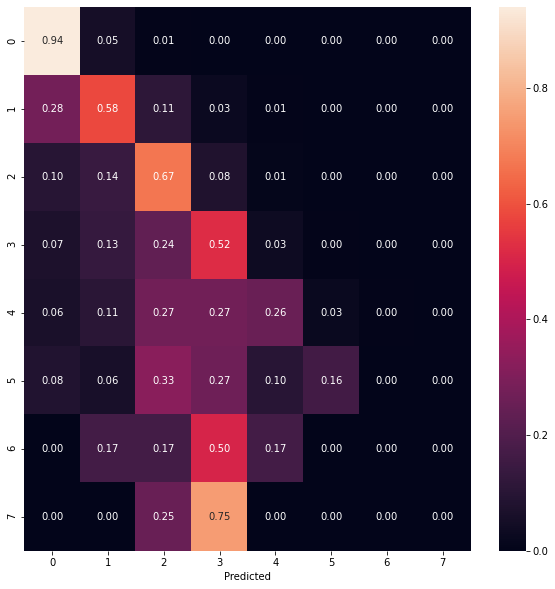

In [78]:
def matconfision(y_test, y_pred):
    '''EN ESTA FUNCION ENTRAN LAS Y ORIGINALES Y LAS PREDICCIONES PARA CREAR UNA MATRIZ DE CONFUSION MAS BONITA'''
    
    cm = confusion_matrix(y_test, y_pred)
    cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    target_names = set(Y_test)
    
    fig, ax = plt.subplots(figsize = (10,10))
    sns.heatmap(cmn, annot=True, fmt='.2f', xticklabels=target_names, yticklabels=target_names)
    plt.xlabel('Predicted')
    
    return plt.show(block=False)

matconfision(Y_test, pred)

<AxesSubplot:>

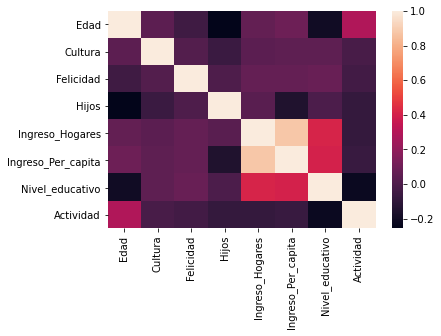

In [79]:
# se genera una matriz de correlacion
sns.heatmap(data.corr(), 
        xticklabels=data.corr().columns,
        yticklabels=data.corr().columns)

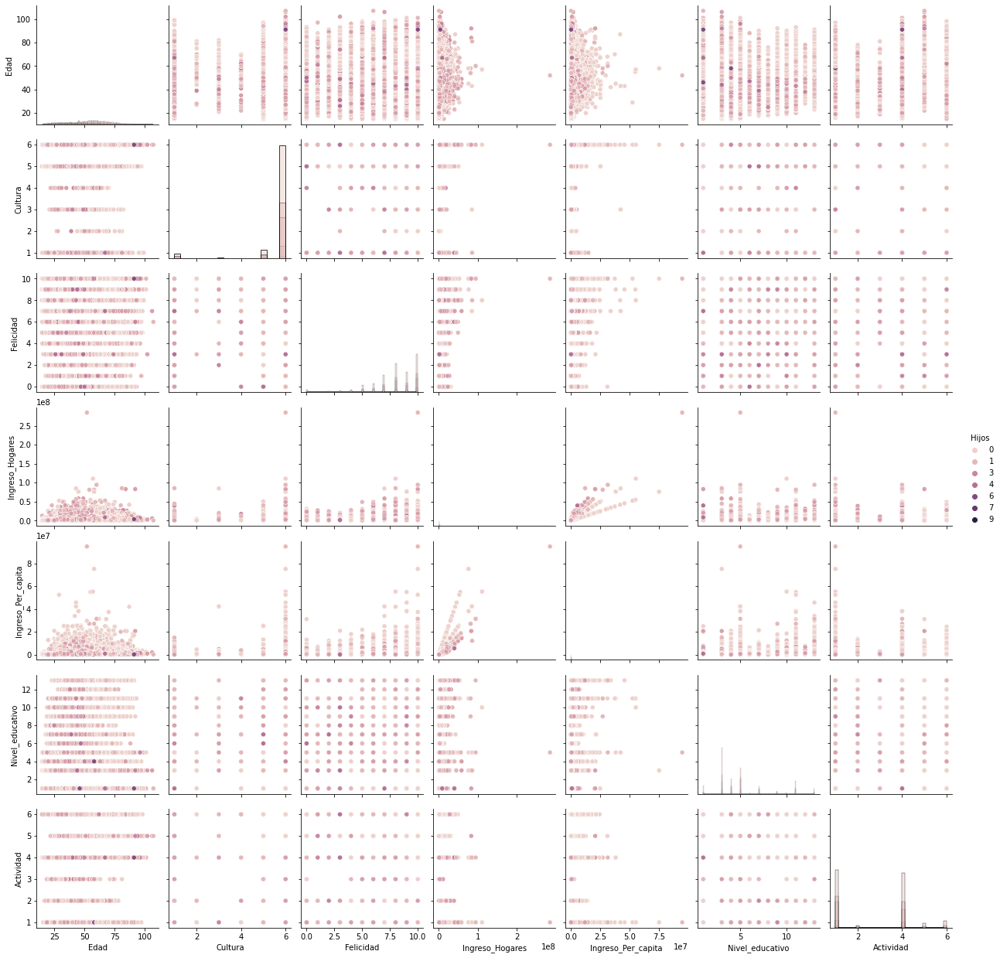

In [80]:
sns.pairplot(data, hue="Hijos", diag_kind="hist")

In [81]:
pd.crosstab(data['Edad'], data['Hijos'], margins=True, dropna=False)


Hijos,0,1,2,3,4,5,6,7,8,9,All
Edad,,,,,,,,,,,
15,49,13,0,0,0,0,0,0,0,0,62
16,92,36,1,0,0,0,0,0,0,0,129
17,96,54,3,1,0,0,0,0,0,0,154
18,164,90,9,1,0,0,0,0,0,0,264
19,259,123,35,5,0,0,0,0,0,0,422
...,...,...,...,...,...,...,...,...,...,...,...
101,1,1,0,0,0,0,0,0,0,0,2
102,0,0,1,0,0,0,0,0,0,0,1
106,0,0,1,0,0,0,0,0,0,0,1


In [82]:
pd.crosstab(data['Cultura'], data['Hijos'], margins=True, dropna=False)


Hijos,0,1,2,3,4,5,6,7,8,9,All
Cultura,,,,,,,,,,,
1,1556,876,729,343,146,46,10,3,0,0,3709
2,17,10,2,1,0,0,0,0,0,0,30
3,106,48,33,10,0,0,0,1,0,0,198
4,19,11,10,5,0,0,0,0,0,0,45
5,2856,1385,1107,430,129,20,5,4,0,0,5936
6,37986,18702,13833,4082,877,190,43,8,3,2,75726
All,42540,21032,15714,4871,1152,256,58,16,3,2,85644


In [83]:
pd.crosstab(data['Felicidad'], data['Hijos'], margins=True, dropna=False)


Hijos,0,1,2,3,4,5,6,7,8,9,All
Felicidad,,,,,,,,,,,
0,722,329,219,72,17,6,0,0,0,0,1365
1,145,88,64,23,5,3,0,0,0,0,328
2,381,182,135,55,9,3,0,0,0,0,765
3,656,288,182,79,23,5,1,1,0,0,1235
4,931,426,312,98,26,6,0,0,0,0,1799
5,2256,1056,835,255,62,15,6,2,0,0,4487
6,2883,1358,965,332,80,16,4,4,0,0,5642
7,5635,2712,2103,619,185,32,10,1,0,0,11297
8,9618,5009,3796,1158,251,60,11,2,1,1,19907


In [53]:
pd.crosstab(data['Nivel_educativo'], data['Hijos'], margins=True, dropna=False)


Hijos,0,1,2,3,4,5,6,7,8,9,All
Nivel_educativo,,,,,,,,,,,
1,2881,827,451,164,67,18,6,5,0,0,4419
3,15489,6307,3966,1538,461,112,29,3,3,2,27910
4,5218,2856,2315,789,196,47,12,5,0,0,11438
5,8748,5613,4727,1468,287,55,6,2,0,0,20906
6,187,100,97,23,4,0,0,0,0,0,411
7,2394,1704,1502,365,78,13,2,1,0,0,6059
8,73,44,33,12,1,0,0,0,0,0,163
9,1025,647,516,113,12,4,0,0,0,0,2317
10,544,243,184,48,6,0,0,0,0,0,1025


In [84]:
pd.crosstab(data['Actividad'], data['Hijos'], margins=True, dropna=False)

Hijos,0,1,2,3,4,5,6,7,8,9,All
Actividad,,,,,,,,,,,
1,19446,10692,8691,2589,576,126,25,7,1,1,42154
2,791,399,333,94,28,8,1,0,0,0,1654
3,45,25,15,6,1,1,0,0,0,0,93
4,18519,8768,6137,2018,505,114,32,9,2,1,36105
5,1554,511,223,75,23,4,0,0,0,0,2390
6,2185,637,315,89,19,3,0,0,0,0,3248
All,42540,21032,15714,4871,1152,256,58,16,3,2,85644


In [85]:
data.columns

Index(['Edad', 'Cultura', 'Felicidad', 'Hijos', 'Ingreso_Hogares',
       'Ingreso_Per_capita', 'Nivel_educativo', 'Actividad'],
      dtype='object')

In [86]:
data['Hijos'] = data['Hijos'].astype(object)
fig = px.scatter(data, x='Edad', y='Ingreso_Per_capita', color = 'Hijos')
fig.show()
fig = px.scatter(data, x='Edad', y='Nivel_educativo', color = 'Hijos')
fig.show()
fig = px.scatter(data, x='Edad', y='Cultura', color = 'Hijos')
fig.show()
fig = px.scatter(data, x='Edad', y='Actividad', color = 'Hijos')
fig.show()

In [87]:
data.columns

Index(['Edad', 'Cultura', 'Felicidad', 'Hijos', 'Ingreso_Hogares',
       'Ingreso_Per_capita', 'Nivel_educativo', 'Actividad'],
      dtype='object')

In [88]:
# reordenar las variables para dejar hijos en la primera columna
data = data.loc[:, ['Hijos', 'Edad', 'Cultura', 'Felicidad', 'Ingreso_Hogares', 'Ingreso_Per_capita', 
                    'Nivel_educativo', 'Actividad']]
# guardar los data_modelo
data.to_csv('Datos/data_modelo.csv', encoding = 'latin1', index = False)